# Кредитный скоринг
``` Ахметов Данияр ```

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
import pandas_profiling
import python_utils 
from sklearn import metrics 
from sklearn.metrics import auc, roc_auc_score, roc_curve
from sklearn.metrics import accuracy_score, recall_score, f1_score, mean_absolute_error, mean_squared_error, precision_score
from sklearn.metrics import confusion_matrix
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.feature_selection import f_classif, mutual_info_classif
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import cross_validate
from mlxtend.feature_selection import ExhaustiveFeatureSelector as EFS
from sklearn.metrics import confusion_matrix, plot_confusion_matrix
from sklearn.metrics import r2_score
from xgboost import XGBClassifier




# Загрузка данных

In [43]:
df_train = pd.read_csv('X_train.csv')
df_test = pd.read_csv('X_test.csv')
pd.set_option('display.max_columns', None)
print('Размерность тренировочного датасета: ', df_train.shape)
display(df_train.head())
print('Размерность тестового датасета: ', df_test.shape)
display(df_test.head())

Размерность тренировочного датасета:  (105109, 10)


,credit_card_utilization,age,overdue_30_59_days,debt_to_income,monthly_income,credits_loans,overdue__more_than_90_days,mortgage_loans,overdue_60_89_days,family_members
0,0.000000,56,0,0.504328,6823.894458,9,0,1,0,5.0
1,0.170659,45,1,2.405860,356.580765,5,0,0,0,0.0
2,0.342176,75,1,0.445066,20349.895825,9,0,3,0,0.0
3,0.046219,50,0,0.814508,2894.368968,12,0,1,0,3.0
4,0.679556,58,0,0.390311,24833.227614,15,0,4,0,2.0


Размерность тестового датасета:  (38876, 11)


,index,credit_card_utilization,age,overdue_30_59_days,debt_to_income,monthly_income,credits_loans,overdue__more_than_90_days,mortgage_loans,overdue_60_89_days,family_members
0,143522,0.021069,60,0,0.184907,14403.715440,9,0,1,0,0.0
1,116747,0.009985,82,0,0.446264,6768.581963,6,0,3,0,0.0
2,66075,0.535187,43,1,0.406317,4686.080429,14,0,2,0,3.0
3,133292,0.051264,31,0,0.311893,3867.175176,8,0,0,0,1.0
4,83134,0.069525,45,0,0.294956,9869.273012,6,0,1,0,2.0


In [44]:
Y_test = pd.read_csv('Y_test_sample.csv', delimiter=',')
Y_train = pd.read_csv('Y_train.csv', delimiter=',')

In [45]:
df_train['target'] = Y_train

In [46]:
df_train.info

<bound method DataFrame.info of         credit_card_utilization  age  overdue_30_59_days  debt_to_income  \
0                      0.000000   56                   0        0.504328   
1                      0.170659   45                   1        2.405860   
2                      0.342176   75                   1        0.445066   
3                      0.046219   50                   0        0.814508   
4                      0.679556   58                   0        0.390311   
...                         ...  ...                 ...             ...   
105104                 0.017608   62                   0        0.184589   
105105                 0.980631   25                   0        0.158753   
105106                 0.050256   73                   1        0.849711   
105107                 0.447882   43                   0        0.068033   
105108                 0.563791   50                   1        0.285641   

        monthly_income  credits_loans  overdue__more_th

In [47]:
Y_test = Y_test.dropna(axis=1)
merged = df_test.merge(Y_test, on='index')
merged.to_csv("X_testa_with_Y.csv", index=False)
df_test = pd.read_csv('X_testa_with_Y.csv')
df_test.head()

,index,credit_card_utilization,age,overdue_30_59_days,debt_to_income,monthly_income,credits_loans,overdue__more_than_90_days,mortgage_loans,overdue_60_89_days,family_members,target
0,143522,0.021069,60,0,0.184907,14403.715440,9,0,1,0,0.0,0.226834
1,116747,0.009985,82,0,0.446264,6768.581963,6,0,3,0,0.0,0.252293
2,66075,0.535187,43,1,0.406317,4686.080429,14,0,2,0,3.0,0.592295
3,133292,0.051264,31,0,0.311893,3867.175176,8,0,0,0,1.0,0.697950
4,83134,0.069525,45,0,0.294956,9869.273012,6,0,1,0,2.0,0.672565


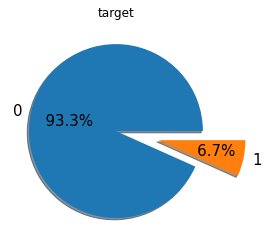

Класс 0 преобладает над классом 1 в 13.9 раз


In [48]:
plt.pie(x=Y_train['target'].value_counts(),
       labels=list(Y_train['target'].value_counts().index),
       autopct='%6.1f%%',
       explode = [0, 0.5],
       shadow=True,
       textprops={'fontsize': 15})
plt.title('target')
plt.show()

print('Класс 0 преобладает над классом 1 в {} раз'.format(
    round(Y_train['target'].value_counts()[0]/Y_train['target'].value_counts()[1],1)))

# Визуализация тестовых и тренировочных данных

In [9]:
pandas_profiling.ProfileReport(df_test)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
pandas_profiling.ProfileReport(df_train)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
df_test.head()

,df_index,credit_card_utilization,age,overdue_30_59_days,debt_to_income,monthly_income,credits_loans,overdue__more_than_90_days,mortgage_loans,overdue_60_89_days,family_members,target
0,143522,0.021069,60,0,0.184907,14403.715440,9,0,1,0,0.0,0.226834
1,116747,0.009985,82,0,0.446264,6768.581963,6,0,3,0,0.0,0.252293
2,66075,0.535187,43,1,0.406317,4686.080429,14,0,2,0,3.0,0.592295
3,133292,0.051264,31,0,0.311893,3867.175176,8,0,0,0,1.0,0.697950
4,83134,0.069525,45,0,0.294956,9869.273012,6,0,1,0,2.0,0.672565


# Почистим данные: 

In [49]:
lower_bound = df_train.monthly_income.quantile(q=0.001)
upper_bound = df_train.monthly_income.quantile(q=0.999)
df_train[(df_train.monthly_income < lower_bound) | (df_train.monthly_income > upper_bound)]
lower_boundtst = df_test.monthly_income.quantile(q=0.002)
upper_boundtst = df_test.monthly_income.quantile(q=0.998)
df_test[(df_test.monthly_income < lower_boundtst) | (df_test.monthly_income > upper_boundtst)]

,index,credit_card_utilization,age,overdue_30_59_days,debt_to_income,monthly_income,credits_loans,overdue__more_than_90_days,mortgage_loans,overdue_60_89_days,family_members,target
86,77487,0.951261,51,0,0.067833,68046.874292,13,0,2,1,1.0,0.297686
480,42453,0.037618,43,0,0.002496,377249.829418,14,0,1,0,1.0,0.677354
874,136903,1.142862,35,1,0.004175,227312.520785,7,0,1,0,0.0,0.632394
1076,16023,0.184358,68,0,0.047087,92527.627563,24,0,1,0,0.0,0.645662
1147,49444,0.424421,66,2,0.339413,63328.509950,11,0,4,0,1.0,0.799289
...,...,...,...,...,...,...,...,...,...,...,...,...
37408,72993,0.896675,54,0,0.058007,67374.258952,9,0,2,0,1.0,0.002790
37940,142116,0.105523,53,0,0.123181,88098.485272,13,0,2,0,5.0,0.431448
38214,65319,0.011308,50,0,0.175486,61992.478283,19,0,5,0,1.0,0.627159
38381,123459,0.048158,67,0,0.136013,96048.804604,17,0,5,0,0.0,0.554726


In [50]:
median_MI = float(df_train['monthly_income'].median())
df_train.loc[(df_train.monthly_income < lower_bound) | (df_train.monthly_income > upper_bound), 'monthly_income'] = np.nan
df_train.monthly_income.dropna()#fillna(median_MI,inplace=True)
median_MItst = float(df_test['monthly_income'].median())
df_test.loc[(df_test.monthly_income < lower_boundtst) | (df_test.monthly_income > upper_boundtst), 'monthly_income'] = np.nan
df_test.monthly_income.fillna(median_MItst,inplace=True)


* в столбце 'age' выбросами были нулевые значения. Их убираем

In [51]:
median_age = float(df_train['age'].median())
df_train.loc[df_train.age==0, 'age'] = np.nan
df_train.age.fillna(median_age,inplace=True)
df_train.age.describe()
median_agetst = float(df_test['age'].median())
df_test.loc[df_test.age==0, 'age'] = np.nan
df_test.age.fillna(median_agetst,inplace=True)

In [52]:
lower_bound1 = df_train.family_members.quantile(q=0.0001)
upper_bound1 = df_train.family_members.quantile(q=0.9999)
median_FM = float(df_train['family_members'].median())
df_train.loc[(df_train.family_members < lower_bound1) | (df_train.family_members > upper_bound1), 'family_members'] = np.nan
df_train.family_members.fillna(median_FM,inplace=True)
median_FMtst = float(df_test['family_members'].median())
df_test.loc[(df_test.family_members < lower_bound1) | (df_test.family_members > upper_bound1), 'family_members'] = np.nan
df_test.family_members.fillna(median_FMtst,inplace=True)

* Проверим % отсутствующих данных

In [53]:
for col in df_test.columns:
    pct_missing = np.mean(df_test[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

index - 0%
credit_card_utilization - 0%
age - 0%
overdue_30_59_days - 0%
debt_to_income - 0%
monthly_income - 0%
credits_loans - 0%
overdue__more_than_90_days - 0%
mortgage_loans - 0%
overdue_60_89_days - 0%
family_members - 0%
target - 0%


In [54]:
df_test.dropna(subset=['monthly_income'], inplace=True)
df_train.dropna(subset=['monthly_income'], inplace=True)

In [55]:
df_train

,credit_card_utilization,age,overdue_30_59_days,debt_to_income,monthly_income,credits_loans,overdue__more_than_90_days,mortgage_loans,overdue_60_89_days,family_members,target
0,0.000000,56.0,0,0.504328,6823.894458,9,0,1,0,5.0,0
1,0.170659,45.0,1,2.405860,356.580765,5,0,0,0,0.0,0
2,0.342176,75.0,1,0.445066,20349.895825,9,0,3,0,0.0,0
3,0.046219,50.0,0,0.814508,2894.368968,12,0,1,0,3.0,0
4,0.679556,58.0,0,0.390311,24833.227614,15,0,4,0,2.0,0
...,...,...,...,...,...,...,...,...,...,...,...
105104,0.017608,62.0,0,0.184589,9928.125255,6,0,2,0,0.0,0
105105,0.980631,25.0,0,0.158753,2187.355843,3,0,0,0,0.0,0
105106,0.050256,73.0,1,0.849711,3961.841113,12,0,2,0,0.0,0
105107,0.447882,43.0,0,0.068033,3705.546719,4,0,0,1,0.0,0


<AxesSubplot:>

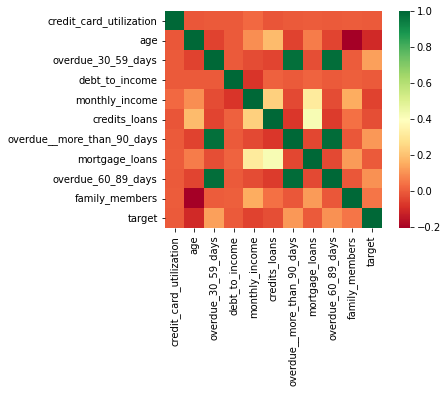

In [56]:
sns.heatmap(df_train.corr(), square=True, cmap='RdYlGn')

In [57]:
df_train.corr()

,credit_card_utilization,age,overdue_30_59_days,debt_to_income,monthly_income,credits_loans,overdue__more_than_90_days,mortgage_loans,overdue_60_89_days,family_members,target
credit_card_utilization,1.000000,-0.006556,-0.001196,-0.001293,0.024730,-0.010369,-0.000897,0.002660,-0.000910,0.003074,-0.001763
age,-0.006556,1.000000,-0.051152,-0.002811,0.095717,0.188697,-0.049799,0.064172,-0.045490,-0.207114,-0.103153
overdue_30_59_days,-0.001196,-0.051152,1.000000,-0.002218,-0.028198,-0.046326,0.977271,-0.024697,0.981402,0.000768,0.129160
debt_to_income,-0.001293,-0.002811,-0.002218,1.000000,-0.076663,0.011098,-0.002645,0.016196,-0.001777,0.007689,-0.003225
monthly_income,0.024730,0.095717,-0.028198,-0.076663,1.000000,0.236713,-0.035425,0.320992,-0.031904,0.154049,-0.047450
credits_loans,-0.010369,0.188697,-0.046326,0.011098,0.236713,1.000000,-0.073708,0.420630,-0.063552,0.038801,-0.025904
overdue__more_than_90_days,-0.000897,-0.049799,0.977271,-0.002645,-0.035425,-0.073708,1.000000,-0.041640,0.990503,-0.006880,0.116487
mortgage_loans,0.002660,0.064172,-0.024697,0.016196,0.320992,0.420630,-0.041640,1.000000,-0.035315,0.119037,-0.003671
overdue_60_89_days,-0.000910,-0.045490,0.981402,-0.001777,-0.031904,-0.063552,0.990503,-0.035315,1.000000,-0.008360,0.100696
family_members,0.003074,-0.207114,0.000768,0.007689,0.154049,0.038801,-0.006880,0.119037,-0.008360,1.000000,0.050878


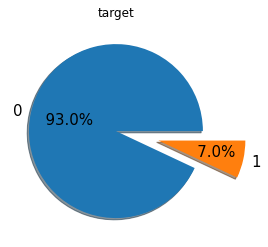

Класс 0 преобладает над классом 1 в 13.3 раз


In [58]:
plt.pie(x=df_train['target'].value_counts(),
       labels=list(df_train['target'].value_counts().index),
       autopct='%6.1f%%',
       explode = [0, 0.5],
       shadow=True,
       textprops={'fontsize': 15})
plt.title('target')
plt.show()

print('Класс 0 преобладает над классом 1 в {} раз'.format(
    round(df_train['target'].value_counts()[0]/df_train['target'].value_counts()[1],1)))

# Видно, что после преобразований соотношение 0 и 1 не сильно поменялось!
* разделим на тренировочные и тестовые датасеты и проверим классические модели


In [59]:
# df_train = df_train.reset_index()
Y_train= df_train.target
df_train = df_train.drop('target', axis = 1)
Y_train.shape

(84031,)

In [60]:
X_train, X_test, y_train, y_test = train_test_split(df_train, Y_train, test_size=0.2, random_state=42)

# Попробуем классические модели
* KNN
* logic regression
* Decision Tree

In [61]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

knn_pipe = Pipeline([('scaler', StandardScaler()), ('knn', KNeighborsClassifier(n_jobs=-1))])
knn_params = {'knn__n_neighbors': range(1, 10)}
knn_grid = GridSearchCV(knn_pipe, knn_params, cv=10, n_jobs=-1, verbose=False)

knn_grid.fit(X_train, y_train)
knn_grid.best_params_, knn_grid.best_score_, accuracy_score(y_test, knn_grid.predict(X_test))


({'knn__n_neighbors': 9}, 0.931929129235821, 0.9301481525554829)

Testing accuracy = 0.9290771702266912
Testing precision = 0.7058823529411765
Testing recall = 0.010008340283569641
Testing F1 = 0.019736842105263157
Testing ROC_AUC = 0.5048439958721794


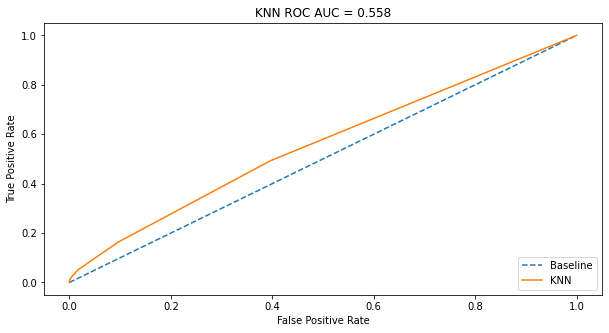

In [62]:
knn_K =  KNeighborsClassifier(n_jobs=-1, n_neighbors = 9)
knn_K.fit(X_train, y_train)
probs_knn = knn_K.predict_proba(X_test)[:,1]
y_pred_knn = knn_K.predict(X_test)


fpr1, tpr1, threshold1 = roc_curve(y_test, probs_knn)
roc_auc = roc_auc_score(y_test, probs_knn)
print('Testing accuracy = {}'.format(metrics.accuracy_score(y_test, y_pred_knn)))
print('Testing precision = {}'.format(metrics.precision_score(y_test, y_pred_knn)))
print('Testing recall = {}'.format(metrics.recall_score(y_test, y_pred_knn)))
print('Testing F1 = {}'.format(metrics.f1_score(y_test, y_pred_knn)))
print('Testing ROC_AUC = {}'.format(metrics.roc_auc_score(y_test, y_pred_knn)))
fig, ax = plt.subplots(figsize=(10,5))
plt.plot([0, 1], label='Baseline', linestyle='--')
plt.plot(fpr1, tpr1, label = 'KNN')
ax.set_title('KNN ROC AUC = %0.3f'%roc_auc)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc='lower right')

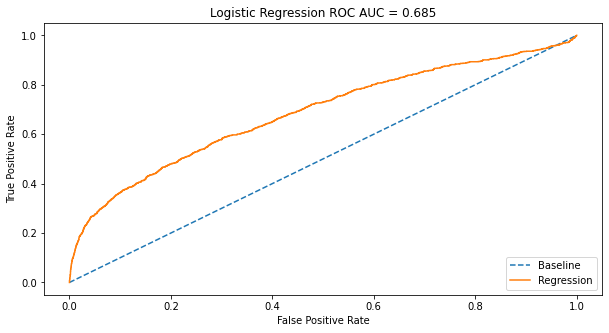

In [63]:
model = LogisticRegression(max_iter = 1000000)
model.fit(X_train, y_train)
probs = model.predict_proba(X_test)
y_pred = model.predict(X_test)
probs = probs[:,1]

fpr, tpr, threshold = roc_curve(y_test, probs)
roc_auc = roc_auc_score(y_test, probs)

fig, ax = plt.subplots(figsize=(10,5))
plt.plot([0, 1], label='Baseline', linestyle='--')
plt.plot(fpr, tpr, label = 'Regression')
ax.set_title('Logistic Regression ROC AUC = %0.3f'%roc_auc)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc='lower right')


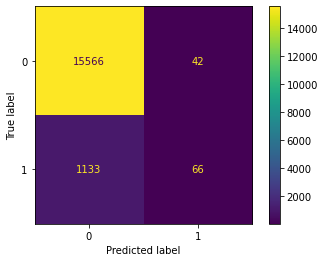

In [64]:
plot_confusion_matrix(model, X_test, y_test)  
plt.show()

In [65]:
from sklearn.tree import DecisionTreeClassifier

param_grid = {'max_features': [5, 6, 7, 8, 9],
              'max_depth' : [5, 6, 7, 8, 9]
             }
tree_clas = DecisionTreeClassifier(random_state=42)
grid_search = GridSearchCV(estimator=tree_clas, param_grid=param_grid, cv=5, verbose=True)
grid_search.fit(X_train, y_train)

grid_search.best_params_ 

Fitting 5 folds for each of 25 candidates, totalling 125 fits


{'max_depth': 6, 'max_features': 9}

AUC scores computed using 5-fold cross-validation: [0.82153153 0.83577454 0.82706529 0.82440112 0.84297945]
Testing accuracy = 0.9300291545189504
Testing precision = 0.5269320843091335
Testing recall = 0.18765638031693077
Testing F1 = 0.2767527675276753
Testing ROC_AUC = 0.5873571496664101


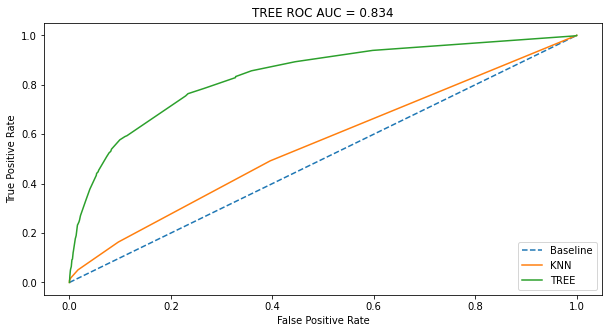

In [66]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score 
tree_B =  DecisionTreeClassifier(max_depth= 6,
 max_features = 9)
tree_B.fit(X_train, y_train)
probs_tree = tree_B.predict_proba(X_test)[:,1]
y_pred_tree = tree_B.predict(X_test)

cv_auc = cross_val_score(tree_B, X_train, y_train, cv=5, scoring='roc_auc')
print("AUC scores computed using 5-fold cross-validation: {}".format(cv_auc))
print('Testing accuracy = {}'.format(metrics.accuracy_score(y_test, y_pred_tree)))
print('Testing precision = {}'.format(metrics.precision_score(y_test, y_pred_tree)))
print('Testing recall = {}'.format(metrics.recall_score(y_test, y_pred_tree)))
print('Testing F1 = {}'.format(metrics.f1_score(y_test, y_pred_tree)))
print('Testing ROC_AUC = {}'.format(metrics.roc_auc_score(y_test, y_pred_tree)))
fpr2, tpr2, threshold2 = roc_curve(y_test, probs_tree)
roc_auc = roc_auc_score(y_test, probs_tree)

fig, ax = plt.subplots(figsize=(10,5))
plt.plot([0, 1], label='Baseline', linestyle='--')
plt.plot(fpr1, tpr1, label = 'KNN')
plt.plot(fpr2, tpr2, label = 'TREE')
ax.set_title('TREE ROC AUC = %0.3f'%roc_auc)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc='lower right')

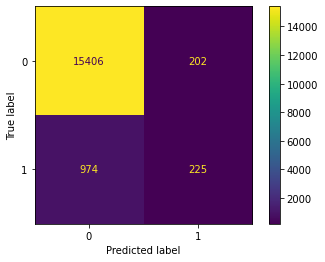

In [67]:
plot_confusion_matrix(tree_B, X_test, y_test)  
plt.show()

Подберем наилучшие параметры для ЛР

In [340]:
# lr_best = LogisticRegression(class_weight='balanced',
#                             random_state=42)

# iter_ = 50
# epsilon_stop = 1e-3

# param_grid = [
#     {'penalty': ['l1'], 
#      'solver': ['liblinear', 'lbfgs'], 
#      'class_weight':['none', 'balanced'], 
#      'multi_class': ['auto','ovr'], 
#      'max_iter':[iter_],
#      'tol':[epsilon_stop]},
#     {'penalty': ['l2'], 
#      'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'], 
#      'class_weight':['none', 'balanced'], 
#      'multi_class': ['auto','ovr'], 
#      'max_iter':[iter_],
#      'tol':[epsilon_stop]},
#     {'penalty': ['none'], 
#      'solver': ['newton-cg', 'lbfgs', 'sag', 'saga'], 
#      'class_weight':['none', 'balanced'], 
#      'multi_class': ['auto','ovr'], 
#      'max_iter':[iter_],
#      'tol':[epsilon_stop]},
# ]
# model_best = GridSearchCV(lr_best, param_grid, scoring='f1', n_jobs=-1, cv=5)

# model_best.fit(X_train, y_train)
# probs = model_best.predict_proba(X_test)
# y_pred = model_best.predict(X_test)
# probs = probs[:,1]

# fpr, tpr, threshold = roc_curve(y_test, probs)
# roc_auc = roc_auc_score(y_test, probs)

# fig, ax = plt.subplots(figsize=(10,5))
# plt.plot([0, 1], label='Baseline', linestyle='--')
# plt.plot(fpr, tpr, label = 'Regression')
# ax.set_title('Logistic Regression ROC AUC = %0.5f'%roc_auc)
# plt.ylabel('True Positive Rate')
# plt.xlabel('False Positive Rate')
# plt.legend(loc='lower right')

# print("Tuned Logistic Regression Parameters: {}".format(model_best.best_params_)) 
# print("Best score is {}".format(model_best.best_score_))



Testing accuracy = 0.8394716487177961
Testing precision = 0.2403879459646692
Testing recall = 0.5788156797331109
Testing F1 = 0.33969652471855116
Testing ROC_AUC = 0.7191554052176574


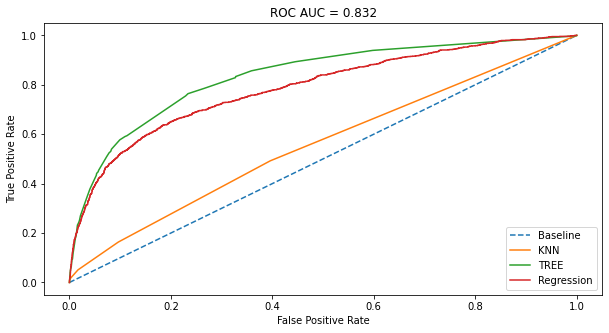

In [68]:
ll = LogisticRegression(class_weight ='balanced', max_iter= 50, multi_class='auto', penalty='l2', solver='liblinear', tol=0.001)
ll.fit(X_train, y_train)
probs = ll.predict_proba(X_test)
y_pred = ll.predict(X_test)
probs = probs[:,1]

fpr3, tpr3, threshold3 = roc_curve(y_test, probs)
roc_auc = roc_auc_score(y_test, probs)

print('Testing accuracy = {}'.format(metrics.accuracy_score(y_test, y_pred)))
print('Testing precision = {}'.format(metrics.precision_score(y_test, y_pred)))
print('Testing recall = {}'.format(metrics.recall_score(y_test, y_pred)))
print('Testing F1 = {}'.format(metrics.f1_score(y_test, y_pred)))
print('Testing ROC_AUC = {}'.format(metrics.roc_auc_score(y_test, y_pred)))
fig, ax = plt.subplots(figsize=(10,5))
plt.plot([0, 1], label='Baseline', linestyle='--')
plt.plot(fpr1, tpr1, label = 'KNN')
plt.plot(fpr2, tpr2, label = 'TREE')
plt.plot(fpr3, tpr3, label = 'Regression')
ax.set_title('ROC AUC = 0.832')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc='lower right')

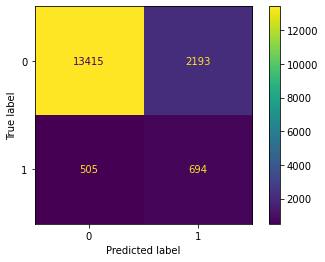

In [69]:
plot_confusion_matrix(ll, X_test, y_test)  
plt.show()

In [70]:
df_test
X = df_test.drop('target',axis=1)
Y = df_test[['index','target']]
X.shape, Y.shape, df_train.shape, Y_train.shape ,df_test.shape

((38876, 11), (38876, 2), (84031, 10), (84031,), (38876, 12))

In [71]:
ll.fit(df_train, Y_train)
y_pred = ll.predict(X.drop('index',axis=1))
s_lr = pd.DataFrame()
s_lr['index'] = df_test['index']
s_lr['target']=y_pred
s_lr.to_csv('submission_logReg2.csv', index = False)

In [72]:
tree_B.fit(df_train, Y_train)
y_pred = tree_B.predict(X.drop('index',axis=1))
s_tree = pd.DataFrame()
s_tree['index'] = df_test['index']
s_tree['target']=y_pred
s_tree.to_csv('submission_tree.csv', index = False)

In [ ]:
knn_K.fit(df_train, Y_train)
y_pred = knn_K.predict(X.drop('index',axis=1))
s_tree = pd.DataFrame()
s_tree['index'] = df_test['index']
s_tree['target']=y_pred
s_tree.to_csv('submission_KNN.csv', index = False)